In [43]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from segmentation_models_pytorch import Unet
import glob
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
# pretrained unet model I used on lab3, not the weights since I combined the image and the mask to get 4 in channels I just used the same model
model_unet = Unet( # pretrained unet
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3, # 3d input
    classes=1, # segment output
).to(device)
model_unet.eval()

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

In [ ]:
# image loader
def load_image(img_path, size=(256,256)):
    img = Image.open(img_path).convert("RGB")
    img = img.resize(size)
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    tensor = transform(img).unsqueeze(0).to(device)
    return img, tensor
image_paths = sorted(
    glob.glob("images/*.png") + glob.glob("images/*.jpg") + glob.glob("images/*.tif")
)

In [ ]:
# target layer and hooks
target_layer = model_unet.encoder.layer4
gradients = None
activations = None

def save_activation(output):
    global activations
    activations = output

def save_gradient(grad_output):
    global gradients
    gradients = grad_output[0]
target_layer.register_forward_hook(save_activation)
target_layer.register_backward_hook(save_gradient)

In [ ]:
# grad cam application
def grad_cam(img_tensor, model):
    # forward
    output = model(img_tensor)     # shape [1,1,H,W]
    loss = output.mean()# global score for segmentation
    # backward
    model.zero_grad()
    loss.backward()

    g = gradients # gradients: [1, C, H, W]
    a = activations  # activations at the target layer

    weights = torch.mean(g, dim=(2,3), keepdim=True)# global avg pool gradients

    cam = (weights * a).sum(dim=1)[0] # weighted sum of activations

    # relu + normalize
    cam = torch.relu(cam)
    cam -= cam.min()
    cam /= cam.max()

    return cam.detach().cpu().numpy()

In [ ]:
# putting the cam on the image for visualization
def overlay_heatmap(original_img, heatmap):
    heatmap = cv2.resize(heatmap, (original_img.width, original_img.height))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    original = np.array(original_img)
    overlay = 0.4 * heatmap + original
    return overlay.astype(np.uint8)

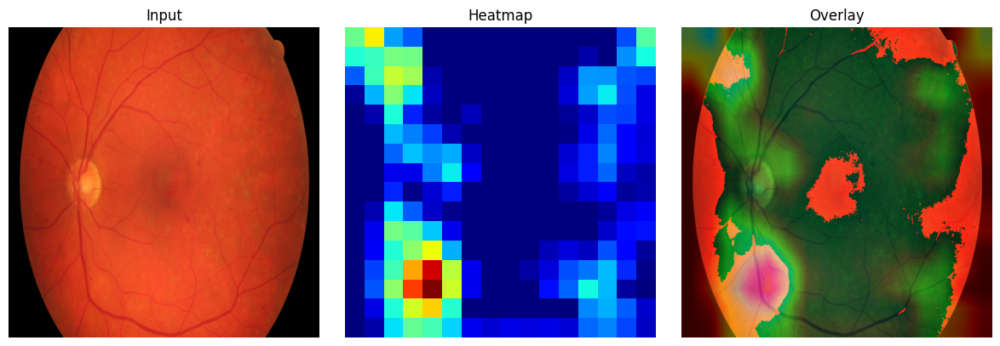

Saved: gradcam_1.png


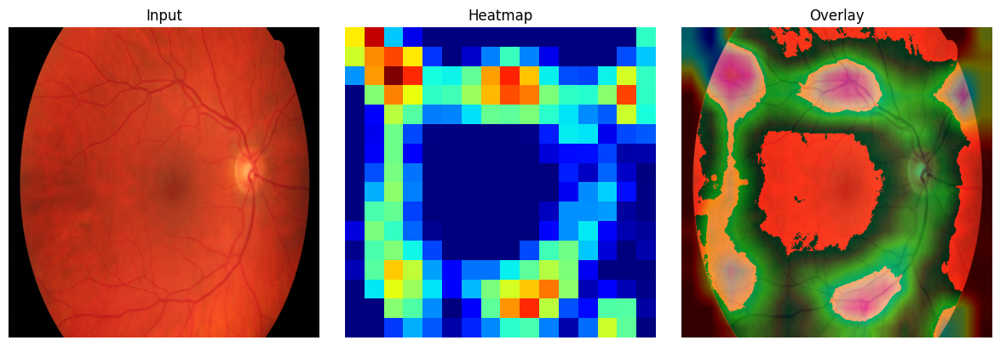

Saved: gradcam_2.png


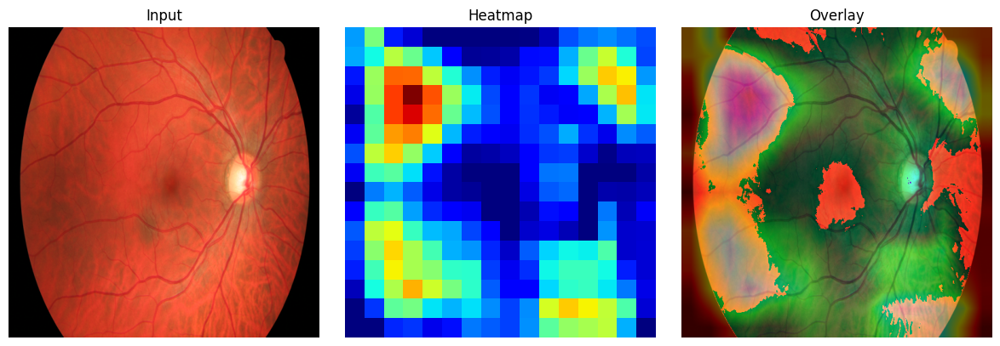

Saved: gradcam_3.png


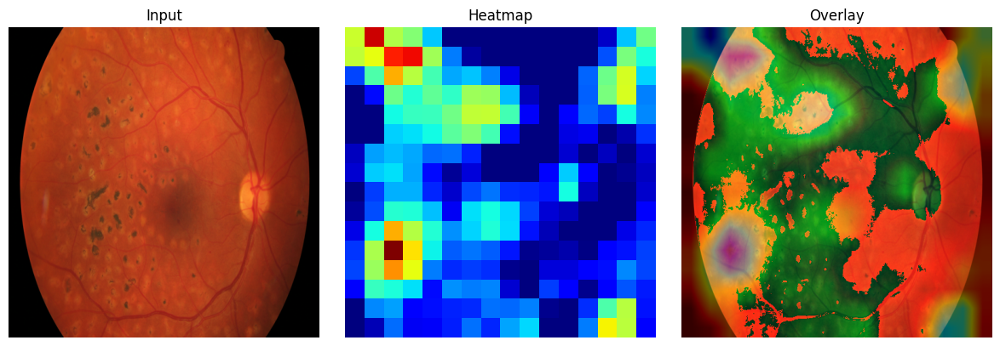

Saved: gradcam_4.png


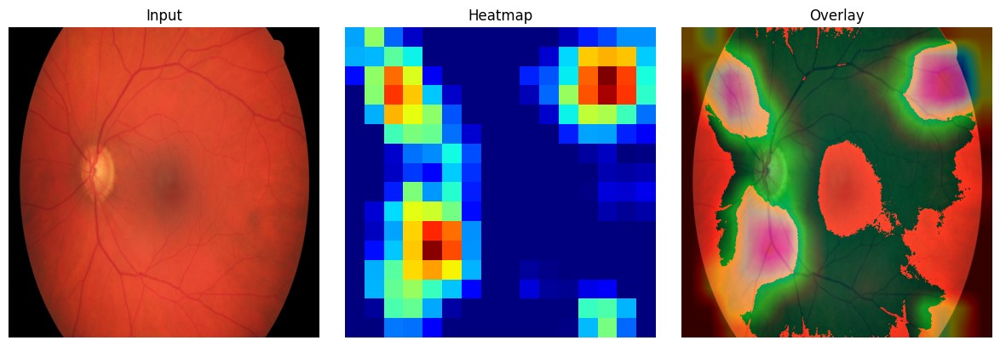

Saved: gradcam_5.png


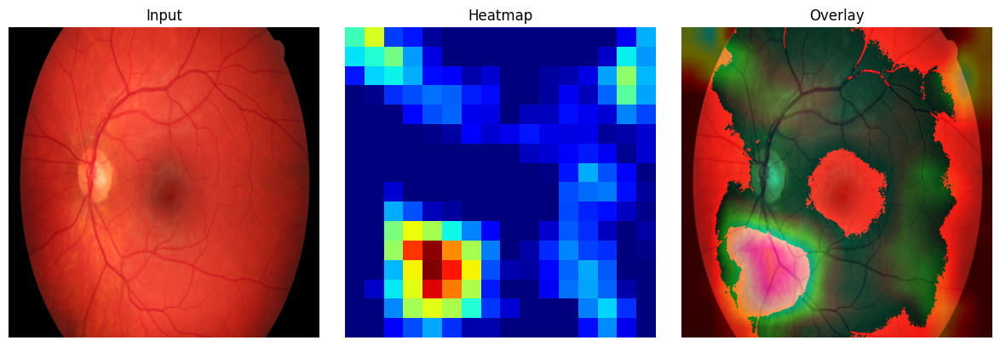

Saved: gradcam_6.png


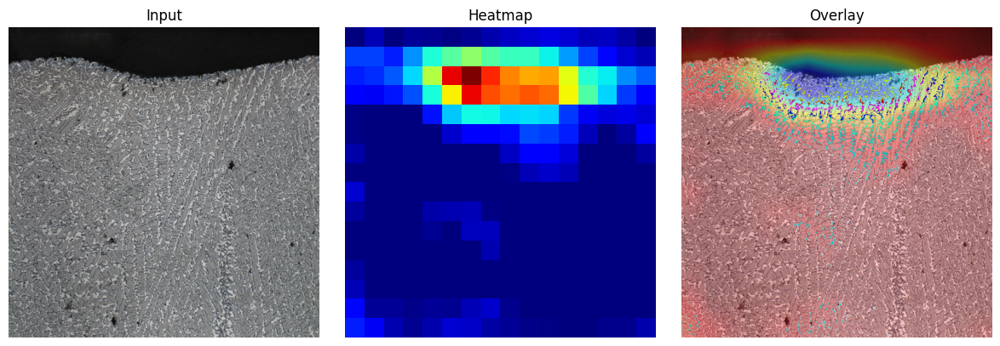

Saved: gradcam_7.png


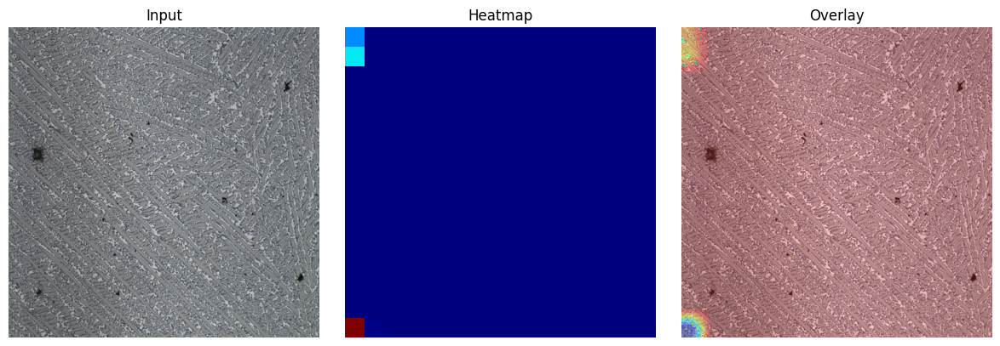

Saved: gradcam_8.png


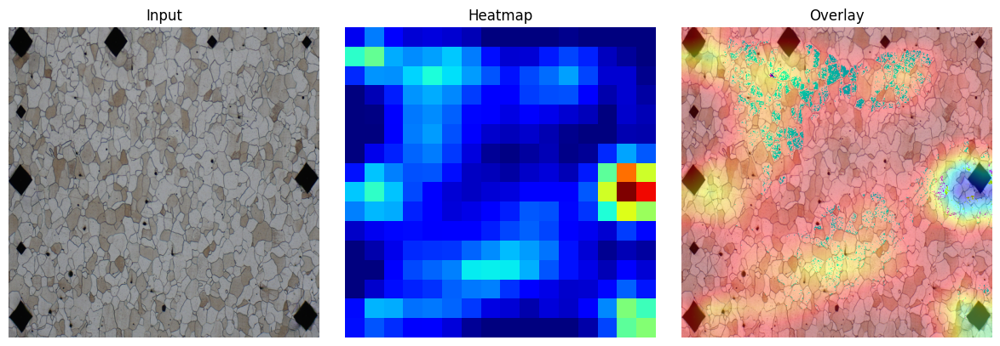

Saved: gradcam_9.png


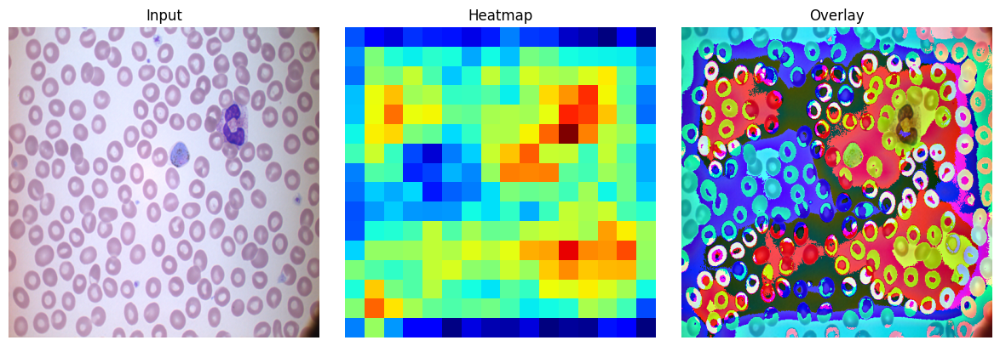

Saved: gradcam_10.png


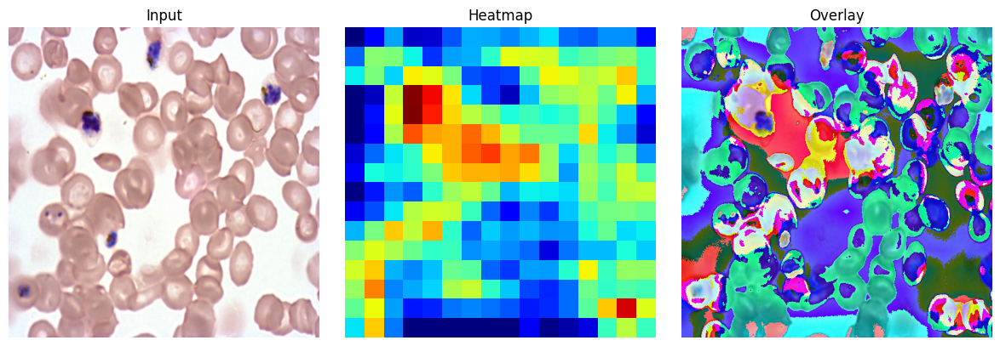

Saved: gradcam_11.png


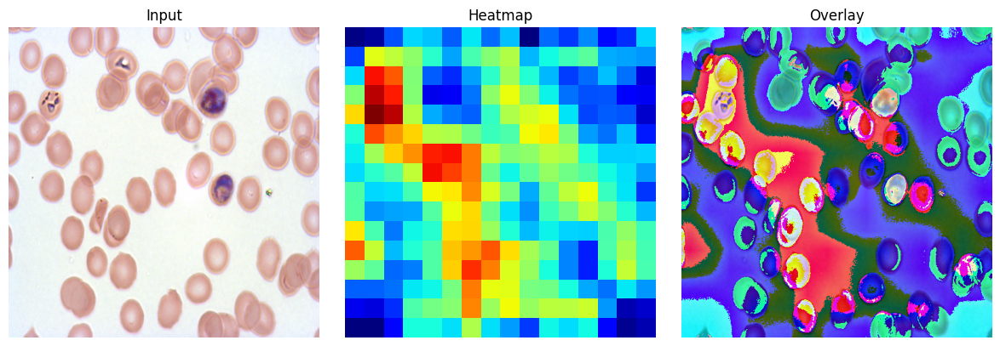

Saved: gradcam_12.png


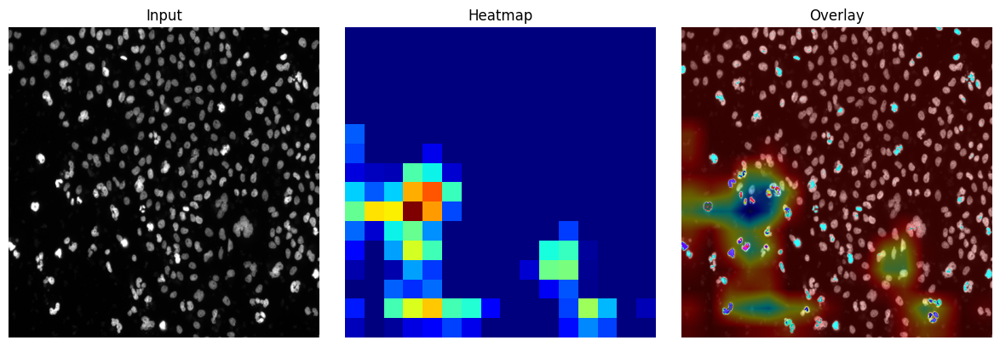

Saved: gradcam_13.png


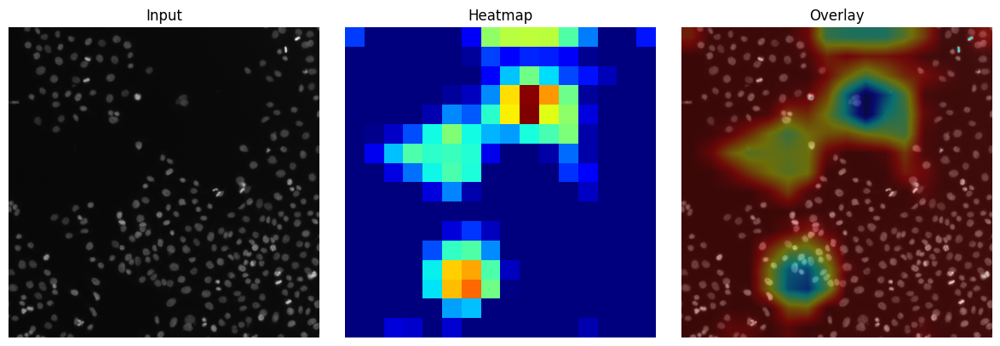

Saved: gradcam_14.png


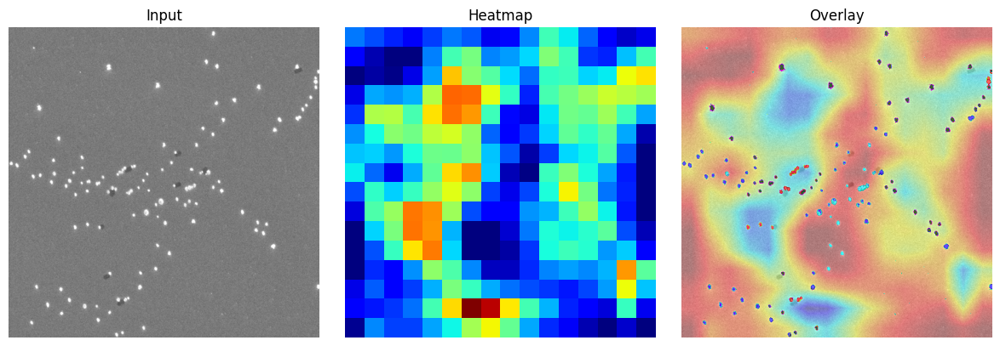

Saved: gradcam_15.png


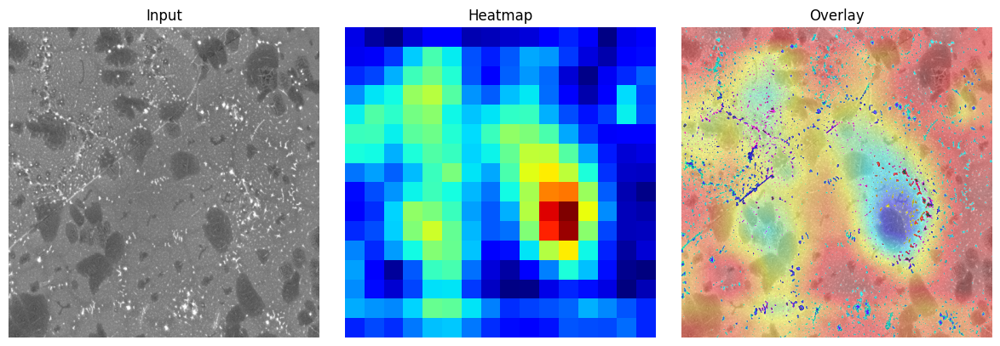

Saved: gradcam_16.png


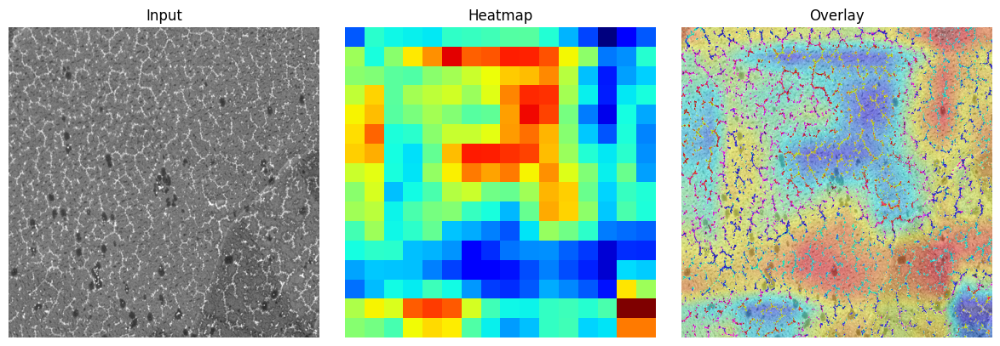

Saved: gradcam_17.png


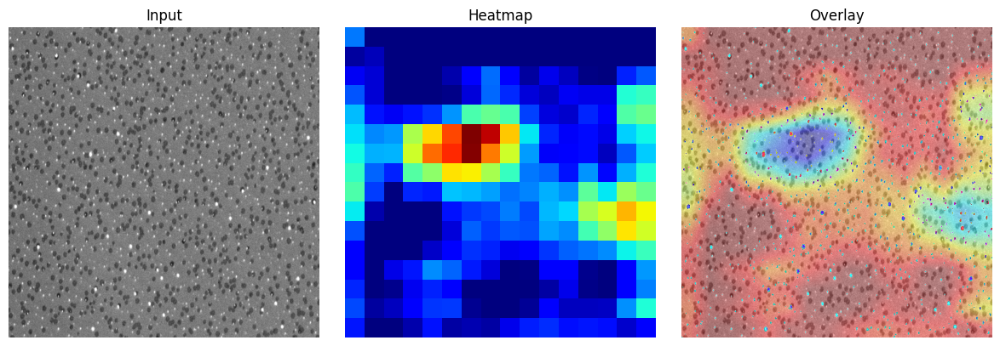

Saved: gradcam_18.png


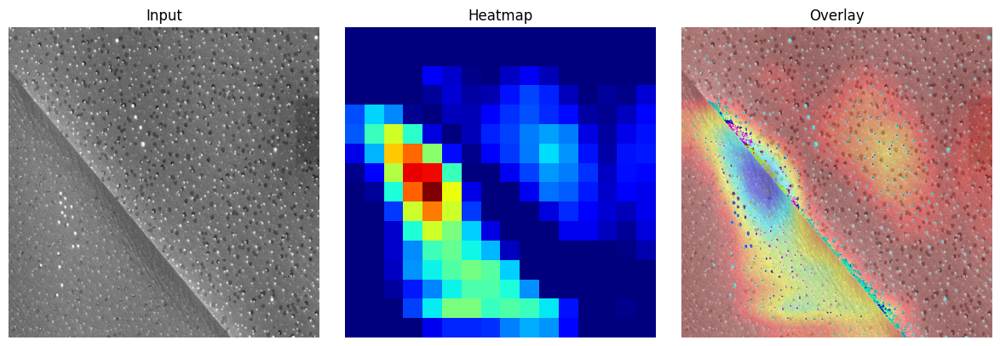

Saved: gradcam_19.png


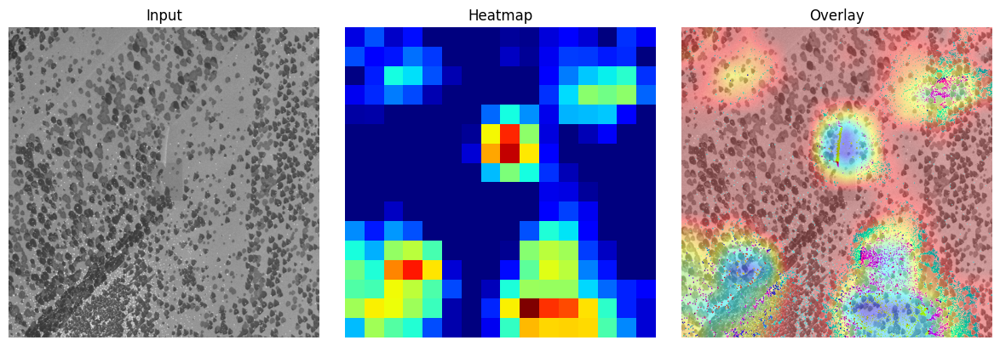

Saved: gradcam_20.png


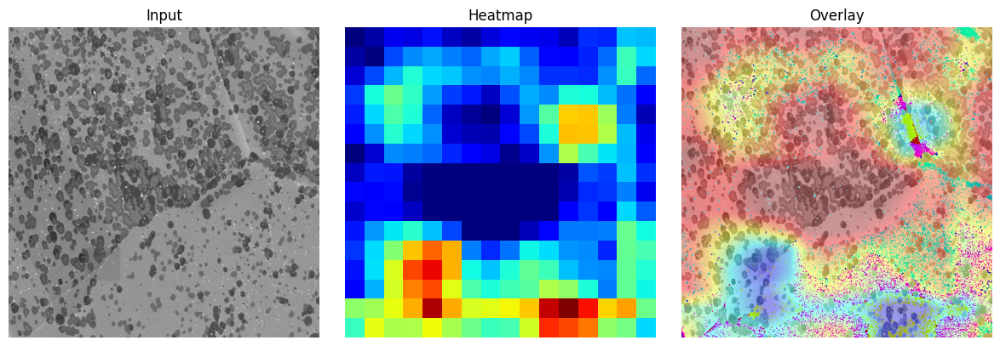

Saved: gradcam_21.png


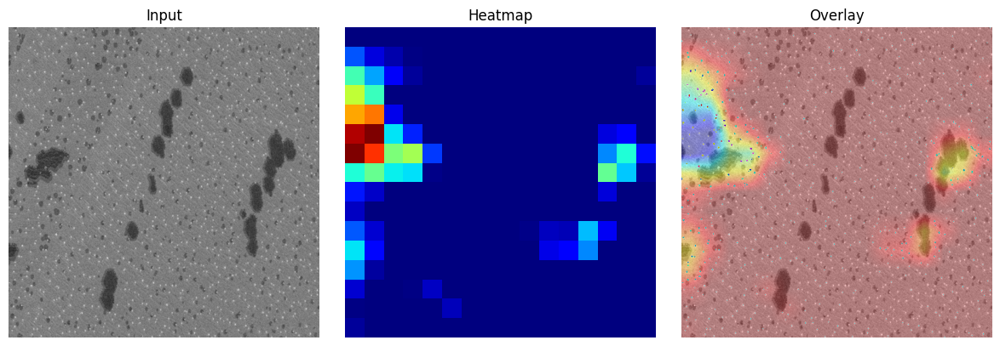

Saved: gradcam_22.png


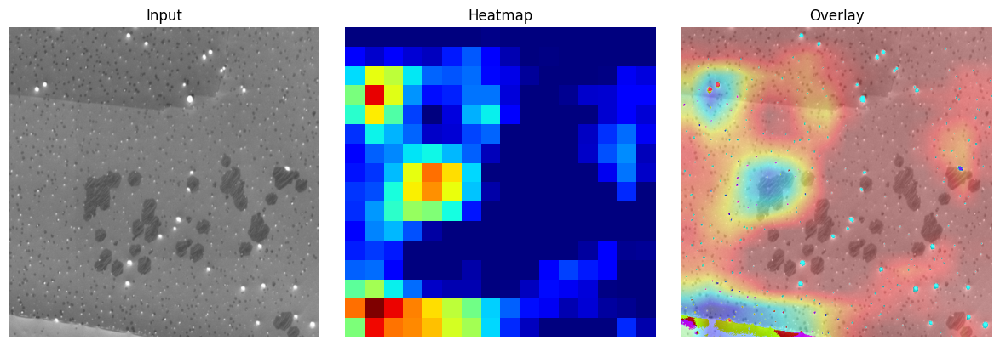

Saved: gradcam_23.png


In [53]:
# loop
for i, p in enumerate(image_paths[:]):
    orig, tensor = load_image(p, (512,512))
    cam = grad_cam(tensor, model_unet)
    overlay = overlay_heatmap(orig, cam)
    
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.title("Input")
    plt.imshow(orig)
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.title("Heatmap")
    plt.imshow(cam, cmap="jet")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.tight_layout()
    plt.show()
    cv2.imwrite(f"gradcam_output/gradcam_{i+1}.png", cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))
    print("Saved:", f"gradcam_{i+1}.png")